<a href="https://colab.research.google.com/github/muneeb706/Algorithms/blob/master/Patient_NoShow_Predictive_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Downloading Required Packages

In [ ]:
!pip install shap

In [ ]:
!pip install imblearn

In [ ]:
!pip install wittgenstein

In [ ]:
!pip install scikit-multiflow

Importing Libraries / Packages.

In [ ]:
%matplotlib inline
## Data Manipulation ##
import numpy as np
import pandas as pd
## Plotting ##
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
## preprocessing ##
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
## Sklearn for data splitting and modeling ##
from sklearn.model_selection import train_test_split
import xgboost
## Interpretable feature selection ##
#!pip install shap
import shap
# for saving objects
import pickle
# for class balancing
from imblearn.over_sampling import SMOTE
# for RIPPER
import wittgenstein as lw
# for HOEFFDING tree
from skmultiflow.trees import HoeffdingTree
from skmultiflow.data import SEAGenerator
from skmultiflow.trees import HoeffdingTreeClassifier

Reading dataset (https://www.kaggle.com/joniarroba/noshowappointments).

In [ ]:
data = pd.read_csv('./sample_data/KaggleV2-May-2016.csv')
df = pd.DataFrame(data=data, columns=data.columns)
print(df.shape)
df.head()


(110527, 14)


,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


Getting list of all features.

In [ ]:
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'Scholarship', 'Hipertension',
       'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

## Feature Engineering

Generating following list of features based on AppointmentDay and Scheduled Day.

1. Scheduled Hour
1. Scheduled Day of Week
1. Scheduled Month
1. Appointment Hour
1. Appointment Day of Week
1. Appointment Month
1. Difference in Days between scheduled and appointment date
1. Same Day Appointment



Generating Scheduled Hour (AM, PM) and renaming existing ScheduledDay Feature.

In [ ]:
# renaming
df = df.rename(columns={'ScheduledDay': 'ScheduledDatetime'})
# Getting AM / PM information
scheduledHour = df.apply(lambda x: 'AM' if (int(x.ScheduledDatetime.split("T")[1].split(":")[0]) < 12)  else 'PM', axis = 1)
df.insert(4, "ScheduledHour", scheduledHour)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'AppointmentDay', 'Age', 'Neighbourhood',
       'Scholarship', 'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap',
       'SMS_received', 'No-show'],
      dtype='object')

Generating Scheduled Day of Week feature from ScheduledDay

In [ ]:
# converting to datetime object
scheduledDateTime = pd.to_datetime(df['ScheduledDatetime'])
# getting weekdays
scheduledWeekday = scheduledDateTime.dt.day_name()
# inserting weekday values in new column in dataframe
df.insert(5, "ScheduledDay", scheduledWeekday)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'AppointmentDay', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Scheduled Month feature.

In [ ]:
month = scheduledDateTime.dt.month_name()
# inserting month values in a new column in dataframe
df.insert(6, "ScheduledMonth", month)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth', 'AppointmentDay',
       'Age', 'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Hour (AM, PM) and renaming existing AppointmentDay Feature.

In [ ]:
# renaming
df = df.rename(columns={'AppointmentDay': 'AppointmentDatetime'})
appointmentHour = df.apply(lambda x: 'AM' if (int(x.AppointmentDatetime.split("T")[1].split(":")[0]) < 12)  else 'PM', axis = 1)
df.insert(8, "AppointmentHour", appointmentHour)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'Age', 'Neighbourhood',
       'Scholarship', 'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap',
       'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Day of Week feature.

In [ ]:
# converting to datetime object
appointmentDateTime = pd.to_datetime(df['AppointmentDatetime'])
# getting weekdays
appointmentWeekday = appointmentDateTime.dt.day_name()
# inserting weekday values in new column in dataframe
df.insert(9, "AppointmentDay", appointmentWeekday)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Generating Appointment Month feature.

In [ ]:
appointmentMonth = appointmentDateTime.dt.month_name()
# inserting month values in a new column in dataframe
df.insert(10, "AppointmentMonth", appointmentMonth)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Age', 'Neighbourhood', 'Scholarship',
       'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received',
       'No-show'],
      dtype='object')

Generating difference in days between scheduled and appointment datetime feature.

In [ ]:
  # Calculating difference in days between appointmentdatetime and scheduleddatetime after removing time information 
  difference = (appointmentDateTime.dt.date.astype('datetime64[ns]') - scheduledDateTime.dt.date.astype('datetime64[ns]')).dt.days
  df.insert(11, "Difference", difference)
  df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Difference', 'Age', 'Neighbourhood', 'Scholarship',
       'Hipertension', 'Diabetes', 'Alcoholism', 'Handcap', 'SMS_received',
       'No-show'],
      dtype='object')

Generating same day appointment feature.

In [ ]:
# getting only scheduled date by removing time
scheduledDate = df.ScheduledDatetime.str.split("T").str[0]
# getting only appointment date by removing time
appointmentDate = df.AppointmentDatetime.str.split("T").str[0]
# comparing ScheduledDatetime and AppointmentDatetime columns to calculate SameDayAppointment
sameDayAppointment = df.apply(lambda x: 1 if (x.ScheduledDatetime.split("T")[0] == x.AppointmentDatetime.split("T")[0])  else 0, axis = 1)
df.insert(12, "SameDayAppointment", sameDayAppointment)
df.columns

Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDatetime',
       'ScheduledHour', 'ScheduledDay', 'ScheduledMonth',
       'AppointmentDatetime', 'AppointmentHour', 'AppointmentDay',
       'AppointmentMonth', 'Difference', 'SameDayAppointment', 'Age',
       'Neighbourhood', 'Scholarship', 'Hipertension', 'Diabetes',
       'Alcoholism', 'Handcap', 'SMS_received', 'No-show'],
      dtype='object')

Verifiying data after feature engineering.

In [ ]:
print(df.shape)
df.head()

(110527, 22)


,PatientId,AppointmentID,Gender,ScheduledDatetime,ScheduledHour,ScheduledDay,ScheduledMonth,AppointmentDatetime,AppointmentHour,AppointmentDay,AppointmentMonth,Difference,SameDayAppointment,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,PM,Friday,April,2016-04-29T00:00:00Z,AM,Friday,April,0,1,56,JARDIM DA PENHA,0,1,1,0,0,0,No


## Preprocessing

Dropping unnecessary columns, that are unrelate to the problem we are trying to solve.

In [ ]:
df = df.drop(['PatientId','AppointmentID','ScheduledDatetime', 'AppointmentDatetime'], axis = 1)

Splitting indepdendent and response / target features.

In [ ]:
X = df.drop('No-show', axis=1)
Y = pd.DataFrame(df['No-show'])

Hot Encoding categorical features.

In [ ]:
X = pd.get_dummies(X, columns=["Gender", "ScheduledHour", "ScheduledDay", "ScheduledMonth", "AppointmentHour", "AppointmentDay", "AppointmentMonth", "Neighbourhood"])

X_features = X.columns
print(X.shape)
X.head()

(110527, 118)


,Difference,SameDayAppointment,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,Gender_F,Gender_M,ScheduledHour_AM,ScheduledHour_PM,ScheduledDay_Friday,ScheduledDay_Monday,ScheduledDay_Saturday,ScheduledDay_Thursday,ScheduledDay_Tuesday,ScheduledDay_Wednesday,ScheduledMonth_April,ScheduledMonth_December,ScheduledMonth_February,ScheduledMonth_January,ScheduledMonth_June,ScheduledMonth_March,ScheduledMonth_May,ScheduledMonth_November,AppointmentHour_AM,AppointmentDay_Friday,AppointmentDay_Monday,AppointmentDay_Saturday,AppointmentDay_Thursday,AppointmentDay_Tuesday,AppointmentDay_Wednesday,AppointmentMonth_April,AppointmentMonth_June,AppointmentMonth_May,Neighbourhood_AEROPORTO,Neighbourhood_ANDORINHAS,Neighbourhood_ANTÔNIO HONÓRIO,...,Neighbourhood_JOANA D´ARC,Neighbourhood_JUCUTUQUARA,Neighbourhood_MARIA ORTIZ,Neighbourhood_MARUÍPE,Neighbourhood_MATA DA PRAIA,Neighbourhood_MONTE BELO,Neighbourhood_MORADA DE CAMBURI,Neighbourhood_MÁRIO CYPRESTE,Neighbourhood_NAZARETH,Neighbourhood_NOVA PALESTINA,Neighbourhood_PARQUE INDUSTRIAL,Neighbourhood_PARQUE MOSCOSO,Neighbourhood_PIEDADE,Neighbourhood_PONTAL DE CAMBURI,Neighbourhood_PRAIA DO CANTO,Neighbourhood_PRAIA DO SUÁ,Neighbourhood_REDENÇÃO,Neighbourhood_REPÚBLICA,Neighbourhood_RESISTÊNCIA,Neighbourhood_ROMÃO,Neighbourhood_SANTA CECÍLIA,Neighbourhood_SANTA CLARA,Neighbourhood_SANTA HELENA,Neighbourhood_SANTA LUÍZA,Neighbourhood_SANTA LÚCIA,Neighbourhood_SANTA MARTHA,Neighbourhood_SANTA TEREZA,Neighbourhood_SANTO ANDRÉ,Neighbourhood_SANTO ANTÔNIO,Neighbourhood_SANTOS DUMONT,Neighbourhood_SANTOS REIS,Neighbourhood_SEGURANÇA DO LAR,Neighbourhood_SOLON BORGES,Neighbourhood_SÃO BENEDITO,Neighbourhood_SÃO CRISTÓVÃO,Neighbourhood_SÃO JOSÉ,Neighbourhood_SÃO PEDRO,Neighbourhood_TABUAZEIRO,Neighbourhood_UNIVERSITÁRIO,Neighbourhood_VILA RUBIM
0,0,1,62,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1,56,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,62,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,8,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,1,56,0,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Label encoding target feature.

In [ ]:
le = LabelEncoder()
Y = Y.apply(le.fit_transform)

## Class Imbalance Problem

Will use SMOTE technique to address this problem.

Exploring percentage of Yes and No values in 'No-show' / target feature. 

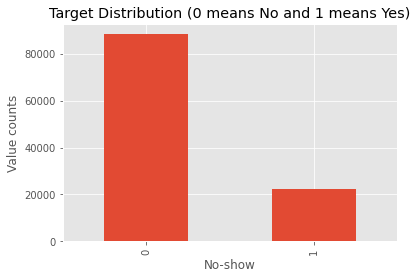

In [ ]:
Y['No-show'].value_counts().plot(kind='bar',title= 'Target Distribution (0 means No and 1 means Yes)', xlabel= 'No-show', ylabel= 'Value counts')

In [ ]:
class_no = round(100 * Y['No-show'].value_counts()[0]/Y.shape[0])
class_yes = round(100 * Y['No-show'].value_counts()[1]/Y.shape[0])
print(f'Percentage of cases per class no is {class_no}%')
print(f'Percentage of cases per class yes is {class_yes}%')

Percentage of cases per class no is 80%
Percentage of cases per class yes is 20%


Applying SMOTE

In [ ]:
sm = SMOTE(random_state=2)
X_cb, Y_cb = sm.fit_sample(X, Y.values.ravel())

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.


In [ ]:
print("After OverSampling, counts of class 'no': {}".format(sum(Y_cb==1)))
print("After OverSampling, counts of class 'yes': {}".format(sum(Y_cb==0)))

After OverSampling, counts of class 'no': 88208
After OverSampling, counts of class 'yes': 88208


Converting Back to dataframe.

In [ ]:
X_cb = pd.DataFrame(X_cb, columns=X.columns[0:len(X_features)])
Y_cb = pd.DataFrame(Y_cb, columns=['No-show'])

Saving and Loading preprocessed training datasets.

In [ ]:
filename = './X_cb.sav'
pickle.dump(X_cb, open(filename, 'wb'))

filename = './Y_cb.sav'
pickle.dump(Y_cb, open(filename, 'wb'))

In [7]:
# Loading class balanced data

filename = './X_cb.sav'
X_cb = pickle.load(open(filename, 'rb'))

filename = './Y_cb.sav'
Y_cb = pickle.load(open(filename, 'rb'))

Splitting the data into 80% and 20% test data using the train_test_split function.

In [ ]:
X_train_cb, X_test_cb, Y_train_cb, Y_test_cb = train_test_split(X_cb, Y_cb, test_size = 0.2, random_state = 19)

Saving data files for future reuse.

In [ ]:
filename = './X_train_cb.sav'
pickle.dump(X_train_cb, open(filename, 'wb'))

filename = './X_test_cb.sav'
pickle.dump(X_test_cb, open(filename, 'wb'))

filename = './Y_train_cb.sav'
pickle.dump(Y_train_cb, open(filename, 'wb'))

filename = './Y_test_cb.sav'
pickle.dump(Y_test_cb, open(filename, 'wb'))

Loading data files.

In [8]:
filename = './X_train_cb.sav'
X_train_cb = pickle.load(open(filename, 'rb'))

filename = './X_test_cb.sav'
X_test_cb = pickle.load(open(filename, 'rb'))

filename = './Y_train_cb.sav'
Y_train_cb = pickle.load(open(filename, 'rb'))

filename = './Y_test_cb.sav'
Y_test_cb = pickle.load(open(filename, 'rb'))

## Feature Selection
Using Shapley Additive Explanations (SHAP).

Fitting XGBOOST model.

In [ ]:
import xgboost

d_train = xgboost.DMatrix(X_train_cb, label=Y_train_cb)
d_test = xgboost.DMatrix(X_test_cb, label=Y_test_cb)

params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(Y_train_cb.values.ravel()),
    "eval_metric": "logloss"
}
model = xgboost.train(params, d_train, 5000, evals = [(d_test, "test")], verbose_eval=100, early_stopping_rounds=20)

[0]	test-logloss:0.69068
Will train until test-logloss hasn't improved in 20 rounds.
[100]	test-logloss:0.561882
[200]	test-logloss:0.51385
[300]	test-logloss:0.489673
[400]	test-logloss:0.473549
[500]	test-logloss:0.461575
[600]	test-logloss:0.452013
[700]	test-logloss:0.442811
[800]	test-logloss:0.435698
[900]	test-logloss:0.42795
[1000]	test-logloss:0.422321
[1100]	test-logloss:0.416248
[1200]	test-logloss:0.410816
[1300]	test-logloss:0.405628
[1400]	test-logloss:0.400895
[1500]	test-logloss:0.396547
[1600]	test-logloss:0.392159
[1700]	test-logloss:0.388196
[1800]	test-logloss:0.38456
[1900]	test-logloss:0.3807
[2000]	test-logloss:0.377438
[2100]	test-logloss:0.373942
[2200]	test-logloss:0.370856
[2300]	test-logloss:0.367797
[2400]	test-logloss:0.364284
[2500]	test-logloss:0.361707
[2600]	test-logloss:0.358959
[2700]	test-logloss:0.356147
[2800]	test-logloss:0.353769
[2900]	test-logloss:0.351572
[3000]	test-logloss:0.349361
[3100]	test-logloss:0.346991
[3200]	test-logloss:0.344644
[

Saving Model.

In [ ]:
filename = './XGB_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [ ]:
from google.colab import files
files.download('./XGB_model.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Reading Model.

In [ ]:
# load the model from disk
filename = './XGB_model.sav'
model = pickle.load(open(filename, 'rb'))
# result = loaded_model.score(X_test, Y_test)

Plotting feature importance based on XGBOOST model.

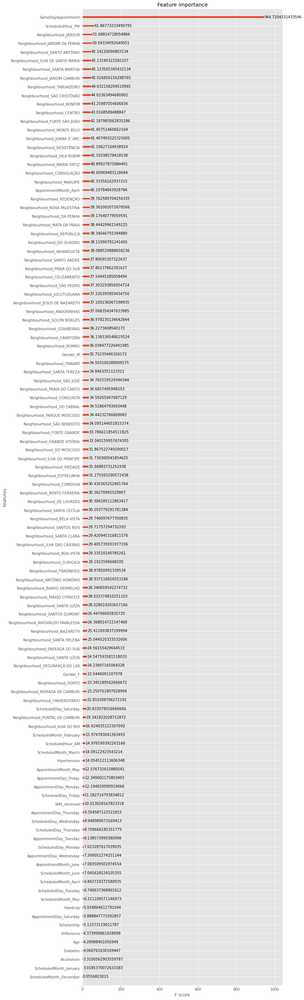

In [ ]:
ax = xgboost.plot_importance(model, importance_type='gain') 
fig = ax.figure
fig.set_size_inches(10, 50)

### SHAP importance

In [ ]:
ex = shap.TreeExplainer(model)

In [ ]:
shap_values = ex.shap_values(X_test_cb)

Saving shap_values.

In [ ]:
filename = './shap_values.sav'
pickle.dump(shap_values, open(filename, 'wb'))

Reading shap_values.

In [ ]:
filename = './shap_values.sav'
shap_values = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./shap_values.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SHAP summary plot.

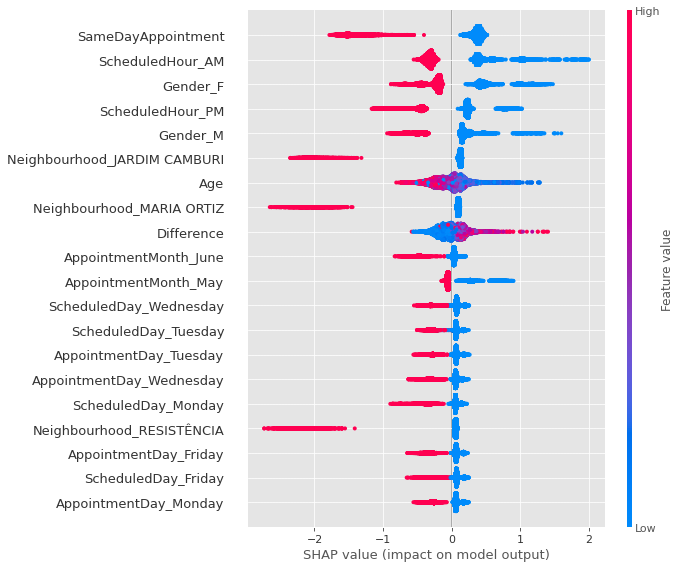

In [ ]:
shap.summary_plot(shap_values, X_test_cb)

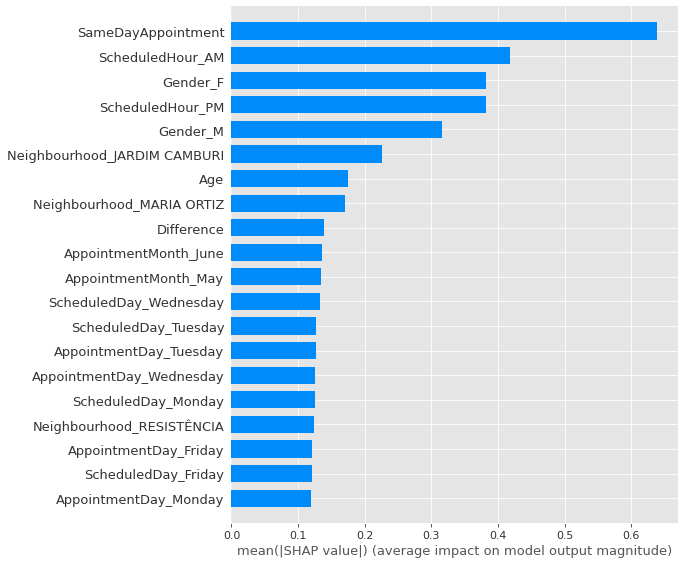

In [ ]:
# Plot summary_plot as barplot:
shap.summary_plot(shap_values, X_test_cb, plot_type='bar')

Sorting feature importance based on the shap values.

In [ ]:
vals= np.abs(shap_values).mean(0)
feature_importance = pd.DataFrame(list(zip(X_train_cb.columns,vals)),columns=['col_name','feature_importance_vals'])
feature_importance.sort_values(by=['feature_importance_vals'],ascending=False,inplace=True)
feature_importance.head(50)


,col_name,feature_importance_vals
1,SameDayAppointment,0.637902
11,ScheduledHour_AM,0.418176
9,Gender_F,0.381984
12,ScheduledHour_PM,0.381803
10,Gender_M,0.316024
75,Neighbourhood_JARDIM CAMBURI,0.225735
2,Age,0.175505
80,Neighbourhood_MARIA ORTIZ,0.170006
0,Difference,0.138361
35,AppointmentMonth_June,0.135835


Extracting features having importance score >= 0.1

In [ ]:
imp_features = feature_importance[feature_importance['feature_importance_vals'] >= 0.1].col_name.values
imp_features

array(['SameDayAppointment', 'ScheduledHour_AM', 'Gender_F',
       'ScheduledHour_PM', 'Gender_M', 'Neighbourhood_JARDIM CAMBURI',
       'Age', 'Neighbourhood_MARIA ORTIZ', 'Difference',
       'AppointmentMonth_June', 'AppointmentMonth_May',
       'ScheduledDay_Wednesday', 'ScheduledDay_Tuesday',
       'AppointmentDay_Tuesday', 'AppointmentDay_Wednesday',
       'ScheduledDay_Monday', 'Neighbourhood_RESISTÊNCIA',
       'AppointmentDay_Friday', 'ScheduledDay_Friday',
       'AppointmentDay_Monday', 'Neighbourhood_JARDIM DA PENHA',
       'ScheduledMonth_May', 'ScheduledDay_Thursday', 'SMS_received',
       'AppointmentDay_Thursday'], dtype=object)

Dependence Plot.

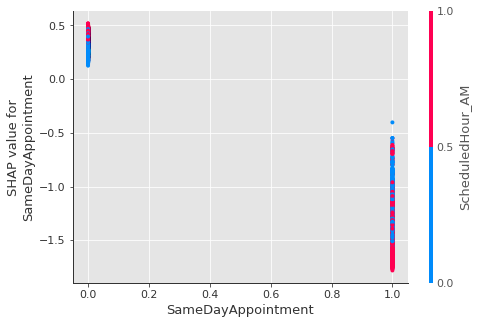

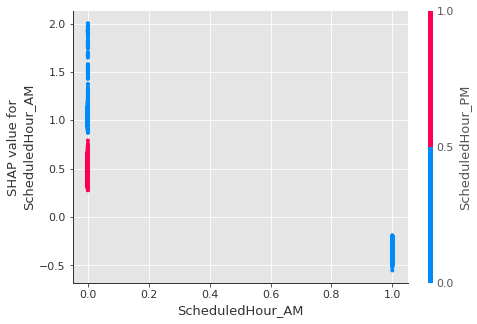

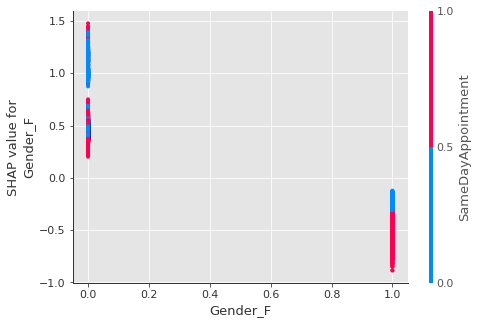

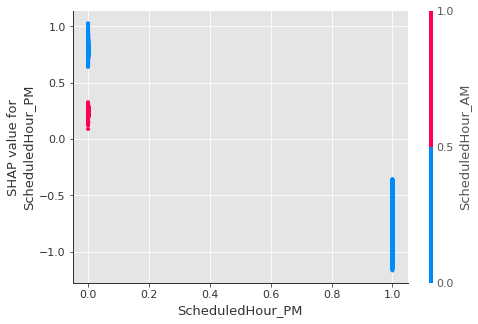

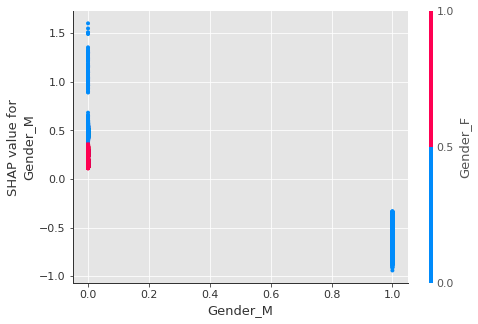

...

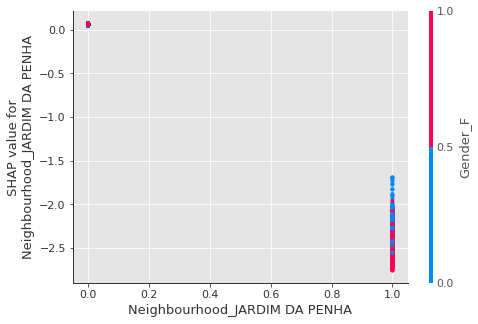

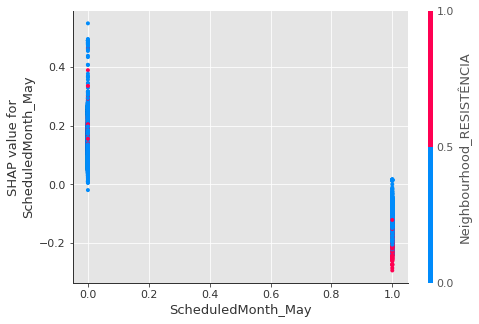

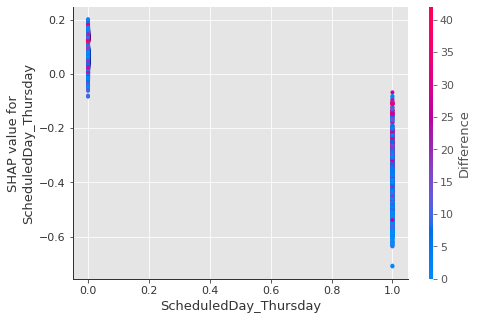

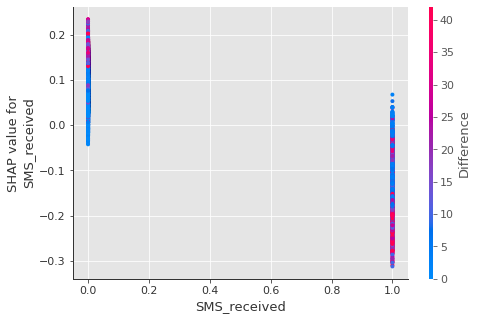

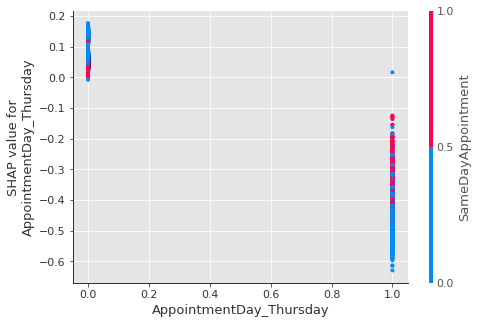

In [ ]:
for feature in imp_features:
  shap.dependence_plot(feature, shap_values, X_test_cb)

Local Interpretability.

In [ ]:
shap.initjs()
shap.force_plot(ex.expected_value, shap_values[0,:], X_train_cb.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(ex.expected_value, shap_values[:1000,:], X_train_cb.iloc[:1000,:])

Extract data containing only the important features (score >= 0.1) selected by SHAP.

In [ ]:
X_train_cb_fs = X_train_cb[imp_features]
X_test_cb_fs = X_test_cb[imp_features]

filename = './X_train_cb_fs.sav'
pickle.dump(X_train_cb_fs, open(filename, 'wb'))

filename = './X_test_cb_fs.sav'
pickle.dump(X_test_cb_fs, open(filename, 'wb'))

In [9]:
# Loading class balanced and important features data

filename = './X_train_cb_fs.sav'
X_train_cb_fs = pickle.load(open(filename, 'rb'))

filename = './X_test_cb_fs.sav'
X_test_cb_fs = pickle.load(open(filename, 'rb'))

## Predictive Modeling

1. RIPPER
2. Hoeffding Trees

### Fitting RIPPER model

In [11]:
ripper_clf = lw.RIPPER(random_state=42, verbosity=2)

Using GridSearchCV to find best parameters for the model and fitting the model with that parameters and training data after feature selection.

In [12]:
from sklearn.model_selection import GridSearchCV

param_grid = {"k": [2, 3], "prune_size": [0.33, 0.5]}
ripper_grid = GridSearchCV(estimator=ripper_clf, param_grid=param_grid, refit=True, verbose=3, cv=5)
ripper_grid.fit(X_train_cb_fs, Y_train_cb)

# Saving ripper_grid model

filename = './ripper_grid.sav'
pickle.dump(ripper_grid, open(filename, 'wb'))

from google.colab import files
files.download('./ripper_grid.sav')

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] k=2, prune_size=0.33 ............................................
fitting bins for features ['Age', 'Difference']



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


growing ruleset...

pos_growset 37928 pos_pruneset 18681
neg_growset 37718 neg_pruneset 18578
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]

pos_growset 36287 pos_pruneset 17873
neg_growset 37718 neg_pruneset 18578
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^AppointmentDay_Friday=0^ScheduledDay_Tuesday=0^ScheduledDay_Friday=0^ScheduledDay_Monday=0^ScheduledDay_Thursday=0^AppointmentDay_Thursday=0^AppointmentDay_Monday=0]
pruned rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^AppointmentDay_Friday=0^ScheduledDay_Tuesday=0^ScheduledDay_Friday=0^ScheduledDay_Monday=0^ScheduledDay_Thursday=0]
updated ruleset: [S

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.9min remaining:    0.0s


growing ruleset...

pos_growset 37928 pos_pruneset 18681
neg_growset 37718 neg_pruneset 18578
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]

pos_growset 36273 pos_pruneset 17866
neg_growset 37718 neg_pruneset 18578
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^ScheduledDay_Tuesday=0^ScheduledDay_Friday=0^ScheduledDay_Thursday=0^ScheduledDay_Monday=0^Gender_M=0^AppointmentDay_Thursday=0]
pruned rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^ScheduledDay_Tuesday=0^ScheduledDay_Friday=0^ScheduledDay_Thursday=0^ScheduledDay_Monday=0]
updated ruleset: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^Appoi

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed: 10.6min remaining:    0.0s


Streaming output truncated to the last 5000 lines.
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]

rule 1 of 10
original: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]
replacement: [SameDayAppointment=0]
revision: [SameDayAppointment=0]
*best: unchanged
best already included in optimization -- retaining original

grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^ScheduledDay_Friday=0^ScheduledDay_Monday=0^ScheduledDay_Tuesday=0^ScheduledDay_Thursday=0^AppointmentDay_Friday=0]
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^ScheduledDay_Friday=0^ScheduledDay_Tuesday=0^ScheduledDay_Monday=0^ScheduledDay_Thursday=0^AppointmentDay_Monday=0^AppointmentDay_Friday=0]

rule 2 of 10
original: [SameDayA

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 78.5min finished


growing ruleset...

pos_growset 47410 pos_pruneset 23352
neg_growset 47147 neg_pruneset 23223
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0]

pos_growset 45331 pos_pruneset 22328
neg_growset 47147 neg_pruneset 23223
grew rule: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDay_Wednesday=0^ScheduledDay_Friday=0^ScheduledDay_Tuesday=0^ScheduledDay_Thursday=0^ScheduledDay_Monday=0^AppointmentDay_Friday=0^AppointmentDay_Thursday=0^AppointmentDay_Monday=0]
pruned rule unchanged
updated ruleset: [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledHour_AM=0^ScheduledHour_PM=0] V [SameDayAppointment=0^SMS_received=0^ScheduledMonth_May=0^AppointmentMonth_June=0^ScheduledDa

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
filename = './ripper_grid.sav'
ripper_grid = pickle.load(open(filename, 'rb'))

Best Parameters

In [13]:
ripper_grid.best_params_

{'k': 2, 'prune_size': 0.33}

### Fitting HOEFFDING Trees Model

 Define a tree for fitting the complete dataset and one for streaming.

In [ ]:
ht_complete = HoeffdingTree()
ht_partial = HoeffdingTree()

'HoeffdingTree' has been renamed to 'HoeffdingTreeClassifier' in v0.5.0.
The old name will be removed in v0.7.0


Using Cross Validations to choose best parameters and to fit the complete dataset.

In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid = {"split_criterion": ['gini', 'info_gain', 'hellinger'], "leaf_prediction": ['nb', 'nba']}
ht_complete_grid = GridSearchCV(estimator=ht_complete, param_grid=param_grid, refit=True, verbose=3, cv=5)
ht_complete_grid.fit(X_train_cb_fs.values, Y_train_cb.values.ravel())

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.702, total=  56.6s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   56.6s remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.704, total=  55.4s
[CV] leaf_prediction=nb, split_criterion=gini ........................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.9min remaining:    0.0s


[CV]  leaf_prediction=nb, split_criterion=gini, score=0.715, total=  56.0s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.694, total=  55.6s
[CV] leaf_prediction=nb, split_criterion=gini ........................
[CV]  leaf_prediction=nb, split_criterion=gini, score=0.698, total=  55.5s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.702, total=  57.1s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.695, total=  57.3s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.688, total=  57.8s
[CV] leaf_prediction=nb, split_criterion=info_gain ...................
[CV]  leaf_prediction=nb, split_criterion=info_gain, score=0.689, total=  57.8s
[CV] leaf_prediction=nb, spli

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 35.8min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=HoeffdingTreeClassifier(binary_split=False, grace_period=200,
                        leaf_prediction='nba', max_byte_size=33554432,
                        memory_estimate_period=1000000, nb_threshold=0,
                        no_preprune=False, nominal_attributes=None,
                        remove_poor_atts=False, split_confidence=1e-07,
                        split_criterion='info_gain', stop_mem_management=False,
                        tie_threshold=0.05),
             iid='deprecated', n_jobs=None,
             param_grid={'leaf_prediction': ['nb', 'nba'],
                         'split_criterion': ['gini', 'info_gain', 'hellinger']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './ht_complete_grid.sav'
pickle.dump(ht_complete_grid, open(filename, 'wb'))

In [ ]:
filename = './ht_complete_grid.sav'
ht_complete_grid = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./ht_complete_grid.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
ht_complete_grid.cv_results_

{'mean_fit_time': array([44.51406231, 46.29445281, 45.91403141, 77.15016298, 80.30369382,
        79.98044138]),
 'mean_score_time': array([11.31645713, 11.25390196, 11.79108739,  7.15391765,  7.02413049,
         6.3464551 ]),
 'mean_test_score': array([0.70270385, 0.693365  , 0.70028073, 0.7217924 , 0.7194895 ,
        0.71555713]),
 'param_leaf_prediction': masked_array(data=['nb', 'nb', 'nb', 'nba', 'nba', 'nba'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_split_criterion': masked_array(data=['gini', 'info_gain', 'hellinger', 'gini', 'info_gain',
                    'hellinger'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'leaf_prediction': 'nb', 'split_criterion': 'gini'},
  {'leaf_prediction': 'nb', 'split_criterion': 'info_gain'},
  {'leaf_prediction': 'nb', 'split_criterion': 'hellinger'},
  {'leaf_prediction': 'nba

In [ ]:
ht_comp_time = np.mean(ht_complete_grid.cv_results_['mean_fit_time'])
print("HOEFFDING TREE training time:", ht_comp_time, "s")

HOEFFDING TREE training time: 62.35947411855062 s


In [ ]:
ht_complete_score = ht_complete_grid.best_estimator_.score(X_test_cb_fs.values, Y_test_cb.values)
ht_complete_score

0.7304443940596305

Best parameters.

In [ ]:
ht_complete_grid.best_params_

{'leaf_prediction': 'nba', 'split_criterion': 'gini'}

Streaming Samples one after another using partial fit.

Streaming output truncated to the last 5000 lines.
Score when streaming after 29713 samples: 0.7078279106677248
Score when streaming after 29714 samples: 0.7078279106677248
Score when streaming after 29715 samples: 0.7078279106677248
Score when streaming after 29716 samples: 0.7078279106677248
Score when streaming after 29717 samples: 0.7078279106677248
Score when streaming after 29718 samples: 0.7078279106677248
Score when streaming after 29719 samples: 0.7078279106677248
Score when streaming after 29720 samples: 0.7078279106677248
Score when streaming after 29721 samples: 0.707742886294071
Score when streaming after 29722 samples: 0.7078279106677248
Score when streaming after 29723 samples: 0.7075728375467634
Score when streaming after 29724 samples: 0.7075728375467634
Score when streaming after 29725 samples: 0.7076578619204172
Score when streaming after 29726 samples: 0.7076578619204172
Score when streaming after 29727 samples: 0.7076578619204172
Score when streaming after 29728 sa

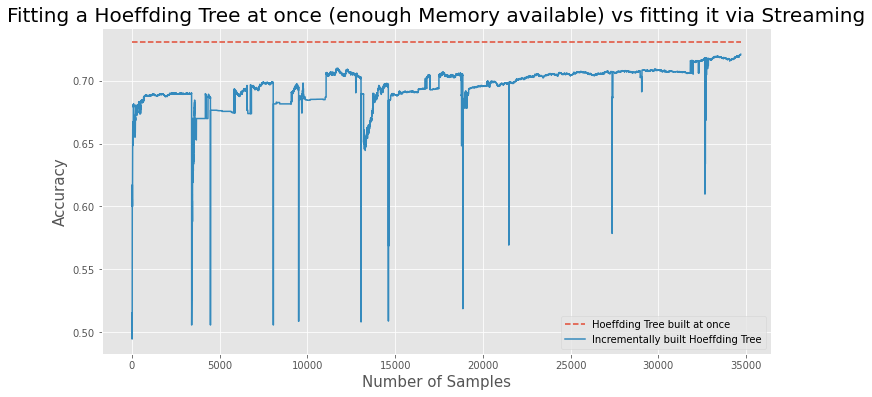

In [ ]:
timer = False
j = 0


# res = []

# filename = './ht_partial_res.sav'
# pickle.dump(res, open(filename, 'wb'))

# ht_partial = HoeffdingTree(leaf_prediction = 'nba', split_criterion = 'gini')

# filename = './ht_partial.sav'
# pickle.dump(ht_partial, open(filename, 'wb'))

filename = './ht_partial_res.sav'
res = pickle.load(open(filename, 'rb'))

filename = './ht_partial.sav'
ht_partial = pickle.load(open(filename, 'rb'))

stopping_criterion = 20

for i in range(len(res), len(X_train_cb_fs.values)):

    ht_partial.partial_fit(X_train_cb_fs.values[i].reshape(1, -1), Y_train_cb.values[i])
    
    res.append(ht_partial.score(X_test_cb_fs.values, Y_test_cb.values))
    
    print(f'Score when streaming after {i} samples: {res[-1]}')

    if res[-1] >= ht_complete_score - 0.01:
        print(f'(Almost) full score reached! Continue for another {stopping_criterion - j} samples.')
        timer = True
    else:
        timer = False

    if timer:
        j += 1
        if j == stopping_criterion:
            break

    filename = './ht_partial.sav'
    pickle.dump(ht_partial, open(filename, 'wb'))

    filename = './ht_partial_res.sav'
    pickle.dump(res, open(filename, 'wb'))

    # if i%100==0:
    #   from google.colab import files
    #   files.download('./ht_partial_res.sav') 

    #   from google.colab import files
    #   files.download('./ht_partial.sav') 



# Plot the scores after each sample.
plt.figure(figsize=(12, 6))
plt.plot([0, i], [ht_complete_score, ht_complete_score], '--', label='Hoeffding Tree built at once')
plt.plot(res, label='Incrementally built Hoeffding Tree')
plt.xlabel('Number of Samples', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
plt.title('Fitting a Hoeffding Tree at once (enough Memory available) vs fitting it via Streaming', fontsize=20)
plt.legend()

In [ ]:
filename = './ht_partial_res.sav'
pickle.dump(res, open(filename, 'wb'))

filename = './ht_partial.sav'
pickle.dump(ht_partial, open(filename, 'wb'))

In [ ]:
from google.colab import files
files.download('./ht_partial_res.sav') 

from google.colab import files
files.download('./ht_partial.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Fitting models using RandomForest Classifier and Boosting methods, which are best known algorithms for patient no-show prediction.

Fitting RandomForest Classifier.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

rf = RandomForestClassifier(verbose = 1)

param_grid = {"criterion": ['gini', 'entropy']}
rf_grid = GridSearchCV(estimator=rf, param_grid=param_grid, refit=True, verbose=3, cv=5)
rf_grid.fit(X_train_cb_fs, Y_train_cb)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   13.8s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.816, total=  13.8s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   27.7s remaining:    0.0s
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.815, total=  13.9s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.814, total=  13.6s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.819, total=  13.3s
[CV] criterion=gini ..................................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   12.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ...................... criterion=gini, score=0.817, total=  13.3s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.817, total=  14.9s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   13.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.817, total=  14.9s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.816, total=  14.9s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.819, total=  15.0s
[CV] criterion=entropy ...............................................


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   14.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  2.4min finished
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ................... criterion=entropy, score=0.816, total=  15.0s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   18.6s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
filename = './rf_grid.sav'
pickle.dump(rf_grid, open(filename, 'wb'))

In [ ]:
filename = './rf_grid.sav'
rf_grid = pickle.load(open(filename, 'rb'))

In [ ]:
from google.colab import files
files.download('./rf_grid.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
rf_grid.cv_results_

{'mean_fit_time': array([12.6544282 , 14.03412366]),
 'mean_score_time': array([0.92338033, 0.91296506]),
 'mean_test_score': array([0.81610833, 0.81678854]),
 'param_criterion': masked_array(data=['gini', 'entropy'],
              mask=[False, False],
        fill_value='?',
             dtype=object),
 'params': [{'criterion': 'gini'}, {'criterion': 'entropy'}],
 'rank_test_score': array([2, 1], dtype=int32),
 'split0_test_score': array([0.81620434, 0.81677118]),
 'split1_test_score': array([0.8149644 , 0.81662947]),
 'split2_test_score': array([0.81424927, 0.81552469]),
 'split3_test_score': array([0.81860696, 0.81864239]),
 'split4_test_score': array([0.81651669, 0.81637497]),
 'std_fit_time': array([0.23804591, 0.03915118]),
 'std_score_time': array([0.00669206, 0.00441468]),
 'std_test_score': array([0.00149558, 0.00102281])}

In [ ]:
rf_comp_time = np.mean(rf_grid.cv_results_['mean_fit_time'])
print("Random Forest training time:", rf_comp_time, "s")

Random Forest training time: 13.34427592754364 s


In [ ]:
rf_grid.best_params_

{'criterion': 'entropy'}

Fitting AdaBoost classifier.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV

adaboost = AdaBoostClassifier(n_estimators=100, random_state=0)

param_grid = {"learning_rate": [0.01, 0.1, 1]}
adaboost_grid = GridSearchCV(estimator=adaboost, param_grid=param_grid, refit=True, verbose=3, cv=5)
adaboost_grid.fit(X_train_cb_fs, Y_train_cb.values.ravel())

Fitting 5 folds for each of 3 candidates, totalling 15 fits
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .................. learning_rate=0.01, score=0.675, total=  12.1s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.1s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.667, total=  13.9s
[CV] learning_rate=0.01 ..............................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   26.0s remaining:    0.0s


[CV] .................. learning_rate=0.01, score=0.667, total=  12.3s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.669, total=  11.7s
[CV] learning_rate=0.01 ..............................................
[CV] .................. learning_rate=0.01, score=0.670, total=  11.7s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.690, total=  11.8s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.680, total=  11.7s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.683, total=  11.6s
[CV] learning_rate=0.1 ...............................................
[CV] ................... learning_rate=0.1, score=0.683, total=  11.6s
[CV] learning_rate=0.1 ...............................................
[CV] .

[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:  3.0min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=100,
                                          random_state=0),
             iid='deprecated', n_jobs=None,
             param_grid={'learning_rate': [0.01, 0.1, 1]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=3)

In [ ]:
filename = './adaboost_grid.sav'
pickle.dump(adaboost_grid, open(filename, 'wb'))

In [ ]:
filename = './adaboost_grid.sav'
adaboost_grid = pickle.load(open(filename, 'rb'))

In [ ]:
adaboost_grid.cv_results_

{'mean_fit_time': array([11.72738361, 11.11205058, 11.11159706]),
 'mean_score_time': array([0.60647006, 0.5827013 , 0.58863893]),
 'mean_test_score': array([0.6696851 , 0.68404755, 0.75826883]),
 'param_learning_rate': masked_array(data=[0.01, 0.1, 1],
              mask=[False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'learning_rate': 0.01},
  {'learning_rate': 0.1},
  {'learning_rate': 1}],
 'rank_test_score': array([3, 2, 1], dtype=int32),
 'split0_test_score': array([0.67506288, 0.68983597, 0.75980444]),
 'split1_test_score': array([0.6668438 , 0.67977468, 0.75952103]),
 'split2_test_score': array([0.66743428, 0.68319989, 0.7578828 ]),
 'split3_test_score': array([0.66931198, 0.68259761, 0.75586339]),
 'split4_test_score': array([0.66977255, 0.68482959, 0.75827251]),
 'std_fit_time': array([0.79772121, 0.05601648, 0.03569173]),
 'std_score_time': array([0.02719131, 0.00458644, 0.01005217]),
 'std_test_score': array([0.00290539, 0.00332252, 0.

In [ ]:
ad_comp_time = np.mean(adaboost_grid.cv_results_['mean_fit_time'])
print("Adaboost training time:", ad_comp_time, "s")

Adaboost training time: 11.317010418574014 s


In [ ]:
from google.colab import files
files.download('./adaboost_grid.sav') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
adaboost_grid.best_params_

{'learning_rate': 1}

## Evaluation

In [ ]:
def evaluatePerf(true_labels, predicted_labels):
    type2 = 0
    type1 = 0
    true_positive = 0
    true_negative = 0
    for x,y in zip(true_labels, predicted_labels):
        if x == y:
            if x == 1:
                true_positive+=1
            else:
                true_negative+=1
        elif x == 1:
            type2 += 1
        elif x == 0:
            type1 += 1

    print("TP:", true_positive, " TN:", true_negative, " T1Err:", type1, " T2Err:", type2)

Loading Trained Models.

In [ ]:
# RIPPER
filename = './ripper_clf.sav'
ripper_clf_cb = pickle.load(open(filename, 'rb'))

# HOEFFDING TREE
filename = './ht_complete_grid.sav'
ht_complete_grid_cb = pickle.load(open(filename, 'rb'))

# RANDOM FOREST
filename = './rf_grid.sav'
rf_grid_cb = pickle.load(open(filename, 'rb'))

# ADABOOST
filename = './adaboost_grid.sav'
adaboost_grid_cb = pickle.load(open(filename, 'rb'))

Loading Test Data

In [ ]:
# test data

filename = './X_test_cb_fs.sav'
X_test_fs = pickle.load(open(filename, 'rb'))

filename = './Y_test_cb.sav'
Y_test = pickle.load(open(filename, 'rb'))

Function to get cross validation score.

In [ ]:
from sklearn.model_selection import cross_val_score

def getCrossValidationScore(model, train_data, train_labels):
  scores = cross_val_score(model, train_data, train_labels, cv=5, verbose=False)
  return np.mean(scores)

Function to get Prediction Accuracy.

In [ ]:
from sklearn.metrics import accuracy_score

def getPredictionAcc(model, test_data, test_labels):
  predict_labels = model.predict(test_data)
  
  return accuracy_score(test_labels, predict_labels)


Function to get Sensitivity.

In [ ]:
from sklearn.metrics import confusion_matrix

def getSensitivity(model, test_data, test_labels):

  predict_labels = model.predict(test_data)

  tn, fp, fn, tp = confusion_matrix(test_labels, predict_labels).ravel()
  
  sensitivity = tp / (tp+fn)
  
  return sensitivity

Function to get Specificity.

In [ ]:
from sklearn.metrics import confusion_matrix

def getSpecificity(model, test_data, test_labels):

  predict_labels = model.predict(test_data)
  
  tn, fp, fn, tp = confusion_matrix(test_labels, predict_labels).ravel()
  
  specificity = tn / (tn+fp)
  
  return specificity

Function to get AUC.

In [ ]:
from sklearn import metrics

def getAUC(model, test_data, test_labels):

  predict_labels = model.predict(test_data)

  fpr, tpr, thresholds = metrics.roc_curve(test_labels, predict_labels, pos_label=1)
  auc = metrics.auc(fpr, tpr)
  
  return auc

Getting Scores for all models.

In [ ]:
# RIPPER scores for evaluation

ripper_acc_score = getPredictionAcc(ripper_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ripper_sensitivity = getSensitivity(ripper_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ripper_specificity = getSpecificity(ripper_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ripper_auc = getAUC(ripper_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
# copying this value from logs, because this value was caclulated during training time, and I forgot to save it and can be seen in logs
ripper_comp_time = 257

print("----- RIPPER Scores -----")
print("")

ripper_cross_val_score = np.mean(ripper_grid.cv_results_['mean_test_score'])

print("Cross Validation Score: " + str(ripper_cross_val_score))
print("Test Score (Accuracy): " + str(ripper_acc_score))
print("Sensitivity Score: " + str(ripper_sensitivity))
print("Specificity Score: " + str(ripper_specificity))
print("AUC Score: " + str(ripper_auc))
print("Computation Time: " + str(ripper_comp_time)+" s")

----- RIPPER Scores -----

Cross Validation Score: 0.8
Test Score (Accuracy): 0.6457601179004648
Sensitivity Score: 0.283789980511292
Specificity Score: 0.9997757596143065
AUC Score: 0.6417828700627993
Computation Time: 257 s


In [ ]:
# Hoeffding Tree scores for evaluation

ht_acc_score = getPredictionAcc(ht_complete_grid.best_estimator_, X_test_cb_fs.values, Y_test_cb.values)
ht_sensitivity = getSensitivity(ht_complete_grid.best_estimator_, X_test_cb_fs.values, Y_test_cb.values)
ht_specificity = getSpecificity(ht_complete_grid.best_estimator_, X_test_cb_fs.values, Y_test_cb.values)
ht_auc = getAUC(ht_complete_grid.best_estimator_, X_test_cb_fs.values, Y_test_cb.values)
# copying this value from logs, because this value was caclulated during training time, and I forgot to save it and can be seen in logs
ht_comp_time = 63

print("----- Hoeffding Tree Scores -----")
print("")

ht_cross_val_score = np.mean(ht_complete_grid.cv_results_['mean_test_score'])

print("Cross Validation Score: " + str(ht_cross_val_score))
print("Test Score (Accuracy): " + str(ht_acc_score))
print("Sensitivity Score: " + str(ht_sensitivity))
print("Specificity Score: " + str(ht_specificity))
print("AUC Score: " + str(ht_auc))
print("Computation Time: " + str(ht_comp_time)+" s")

----- Hoeffding Tree Scores -----

Cross Validation Score: 0.7088647658960306
Test Score (Accuracy): 0.7304443940596305
Sensitivity Score: 0.7527800068783675
Specificity Score: 0.7085996187913444
AUC Score: 0.730689812834856
Computation Time: 63 s


In [ ]:
# Random Forest scores for evaluation

rf_acc_score = getPredictionAcc(rf_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
rf_sensitivity = getSensitivity(rf_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
rf_specificity = getSpecificity(rf_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
rf_auc = getAUC(rf_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
# copying this value from logs, because this value was caclulated during training time, and I forgot to save it and can be seen in logs
rf_comp_time = 14

print("----- Random Forest Scores -----")
print("")

rf_cross_val_score = np.mean(rf_grid.cv_results_['mean_test_score'])

print("Cross Validation Score: " + str(rf_cross_val_score))
print("Test Score (Accuracy): " + str(rf_acc_score))
print("Sensitivity Score: " + str(rf_sensitivity))
print("Specificity Score: " + str(rf_specificity))
print("AUC Score: " + str(rf_auc))
print("Computation Time: " + str(rf_comp_time)+" s")

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


----- Random Forest Scores -----

Cross Validation Score: 0.8164484355934815
Test Score (Accuracy): 0.8284208139666704
Sensitivity Score: 0.8249455462570217
Specificity Score: 0.8318197107299025
AUC Score: 0.8283826284934621
Computation Time: 14 s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.1s finished


In [ ]:
# Adaboost scores for evaluation

ad_acc_score = getPredictionAcc(adaboost_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ad_sensitivity = getSensitivity(adaboost_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ad_specificity = getSpecificity(adaboost_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
ad_auc = getAUC(adaboost_grid.best_estimator_, X_test_cb_fs, Y_test_cb)
# copying this value from logs, because this value was caclulated during training time, and I forgot to save it and can be seen in logs
ad_comp_time = 11

print("----- Adaboost Scores -----")
print("")

ad_cross_val_score = np.mean(adaboost_grid.cv_results_['mean_test_score'])

print("Cross Validation Score: " + str(ad_cross_val_score))
print("Test Score (Accuracy): " + str(ad_acc_score))
print("Sensitivity Score: " + str(ad_sensitivity))
print("Specificity Score: " + str(ad_specificity))
print("AUC Score: " + str(ad_auc))
print("Computation Time: " + str(ad_comp_time)+" s")

----- Adaboost Scores -----

Cross Validation Score: 0.7040004940059754
Test Score (Accuracy): 0.763603899784605
Sensitivity Score: 0.7843058580763499
Specificity Score: 0.7433568785738311
AUC Score: 0.7638313683250905
Computation Time: 11 s
